<a href="https://colab.research.google.com/github/SMRayeed/Paleo-Data-Classification/blob/main/04_Data_Cleaning_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import pandas as pd

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
csv_file_path = '/content/drive/MyDrive/AI4C-Project/final_merged_df.csv'

In [4]:
df = pd.read_csv(csv_file_path)
df = df.rename(columns={'index': 'tree-id'})

In [5]:
df.head(3)

,tree-id,1,2,3,4,5,6,7,8,9,...,2021,2022,2023,site,loc,N,S,E,W,species
0,GRM101_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
1,GRM107_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
2,GRM108_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL


In [6]:
values_per_column = df.iloc[:,1:-7].count()
top_50 = values_per_column.nlargest(50)
top_50 = top_50.sort_index()
top_100 = values_per_column.nlargest(100)
top_100 = top_100.sort_index()
top_250 = values_per_column.nlargest(250)
top_250 = top_250.sort_index()

print("Top 250 Columns: Tree-ring data-wise")
print('====================================')

for year, count in top_50.items() :
    print(f"Year (CE) : {year:<10} Count : {count}")

Top 250 Columns: Tree-ring data-wise
Year (CE) : 1922       Count : 20805
Year (CE) : 1923       Count : 20857
Year (CE) : 1924       Count : 20907
Year (CE) : 1925       Count : 20943
Year (CE) : 1926       Count : 20976
Year (CE) : 1927       Count : 21012
Year (CE) : 1928       Count : 21079
Year (CE) : 1929       Count : 21138
Year (CE) : 1930       Count : 21215
Year (CE) : 1931       Count : 21240
Year (CE) : 1932       Count : 21319
Year (CE) : 1933       Count : 21365
Year (CE) : 1934       Count : 21430
Year (CE) : 1935       Count : 21470
Year (CE) : 1936       Count : 21504
Year (CE) : 1937       Count : 21563
Year (CE) : 1938       Count : 21644
Year (CE) : 1939       Count : 21718
Year (CE) : 1940       Count : 21771
Year (CE) : 1941       Count : 21771
Year (CE) : 1942       Count : 21835
Year (CE) : 1943       Count : 21900
Year (CE) : 1944       Count : 21958
Year (CE) : 1945       Count : 22009
Year (CE) : 1946       Count : 22076
Year (CE) : 1947       Count : 22136
Y

In [7]:
yr_s, yr_f = int(top_50.index[0]), int(top_50.index[-1])
print(f'Top 50 Starts   : {yr_s}')
print(f'Top 50 Finishes : {yr_f}')

Top 50 Starts   : 1922
Top 50 Finishes : 1971


In [8]:
yr_s100, yr_f100 = int(top_100.index[0]), int(top_100.index[-1])
print(f'Top 100 Starts   : {yr_s100}')
print(f'Top 100 Finishes : {yr_f100}')

Top 100 Starts   : 1880
Top 100 Finishes : 1979


In [9]:
yr_s250, yr_f250 = int(top_250.index[0]), int(top_250.index[-1])
print(f'Top 50 Starts   : {yr_s250}')
print(f'Top 50 Finishes : {yr_f250}')

Top 50 Starts   : 1745
Top 50 Finishes : 1994


In [10]:
df_top_50 = df.loc[:, ['tree-id', 'site', 'loc', 'N', 'S', 'E', 'W', 'species'] + list(map(str, range(yr_s, yr_f+1)))]
df_top_50 = df_top_50.reindex(['tree-id'] + list(map(str, range(yr_s, yr_f+1))) + ['site', 'loc', 'N', 'S', 'E', 'W', 'species'], axis=1)

In [11]:
df_top_100 = df.loc[:, ['tree-id', 'site', 'loc', 'N', 'S', 'E', 'W', 'species'] + list(map(str, range(yr_s100, yr_f100+1)))]
df_top_100 = df_top_100.reindex(['tree-id'] + list(map(str, range(yr_s100, yr_f100+1))) + ['site', 'loc', 'N', 'S', 'E', 'W', 'species'], axis=1)

In [12]:
df_top_250 = df.loc[:, ['tree-id', 'site', 'loc', 'N', 'S', 'E', 'W', 'species'] + list(map(str, range(yr_s250, yr_f250+1)))]
df_top_250 = df_top_250.reindex(['tree-id'] + list(map(str, range(yr_s250, yr_f250+1))) + ['site', 'loc', 'N', 'S', 'E', 'W', 'species'], axis=1)

In [13]:
df_top_50

,tree-id,1922,1923,1924,1925,1926,1927,1928,1929,1930,...,1969,1970,1971,site,loc,N,S,E,W,species
0,GRM101_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
1,GRM107_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
2,GRM108_raw,0.710,0.774,0.762,1.014,0.876,0.802,0.840,0.828,0.802,...,0.556,0.854,0.586,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
3,GRM109_raw,1.100,1.240,1.050,0.954,0.904,0.866,0.844,0.950,0.738,...,0.378,0.726,0.602,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
4,GRM110_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28632,VPB121_raw,0.550,0.626,0.639,0.904,1.000,1.379,1.255,0.526,0.499,...,1.372,0.592,0.644,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28633,VPB122_raw,0.465,0.329,0.345,0.727,0.701,0.856,0.689,0.661,0.382,...,1.021,0.572,0.564,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28634,VPB141_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28635,VPB142_raw,1.667,1.485,1.699,1.760,1.621,1.103,1.316,1.008,0.483,...,1.072,0.596,0.193,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO


In [14]:
df_top_100

,tree-id,1880,1881,1882,1883,1884,1885,1886,1887,1888,...,1977,1978,1979,site,loc,N,S,E,W,species
0,GRM101_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
1,GRM107_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
2,GRM108_raw,0.228,0.168,0.090,0.116,0.136,0.138,0.130,0.150,0.152,...,0.962,0.930,0.804,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
3,GRM109_raw,0.336,0.258,0.214,0.148,0.274,0.198,0.236,0.280,0.224,...,0.514,0.524,0.406,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
4,GRM110_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28632,VPB121_raw,0.094,0.027,0.474,0.317,0.417,0.529,0.453,0.513,0.360,...,0.329,0.519,0.358,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28633,VPB122_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.348,0.446,0.538,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28634,VPB141_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28635,VPB142_raw,0.568,0.074,0.806,0.690,1.018,1.292,1.220,1.503,0.600,...,0.120,0.579,0.534,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO


In [15]:
df_top_250

,tree-id,1745,1746,1747,1748,1749,1750,1751,1752,1753,...,1992,1993,1994,site,loc,N,S,E,W,species
0,GRM101_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
1,GRM107_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
2,GRM108_raw,0.632,0.812,0.804,0.784,0.714,0.582,1.034,0.846,0.922,...,0.358,0.378,0.538,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
3,GRM109_raw,1.146,1.016,1.292,1.244,1.136,1.202,1.124,0.966,0.660,...,0.244,0.254,0.502,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
4,GRM110_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28632,VPB121_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.933,0.971,0.708,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28633,VPB122_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.643,0.740,0.935,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28634,VPB141_raw,0.301,0.619,0.556,0.000,0.380,0.218,0.493,0.275,0.535,...,NaN,NaN,NaN,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28635,VPB142_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.739,0.455,0.764,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO


In [16]:
threshold_percentage = 30

nan_counts_50  = df_top_50.isna().sum(axis=1)
nan_counts_100 = df_top_100.isna().sum(axis=1)
nan_counts_250 = df_top_250.isna().sum(axis=1)

df_top50  = df_top_50[nan_counts_50 <= (threshold_percentage / 100)*(len(df_top_50.columns))]
df_top100 = df_top_100[nan_counts_100 <= (threshold_percentage / 100)*(len(df_top_100.columns))]
df_top250 = df_top_250[nan_counts_250 <= (threshold_percentage / 100)*(len(df_top_250.columns))]

In [17]:
df_top50

,tree-id,1922,1923,1924,1925,1926,1927,1928,1929,1930,...,1969,1970,1971,site,loc,N,S,E,W,species
2,GRM108_raw,0.710,0.774,0.762,1.014,0.876,0.802,0.840,0.828,0.802,...,0.556,0.854,0.586,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
3,GRM109_raw,1.100,1.240,1.050,0.954,0.904,0.866,0.844,0.950,0.738,...,0.378,0.726,0.602,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
9,GRM128_raw,0.940,1.230,1.072,1.212,0.964,0.840,0.726,0.678,0.556,...,0.530,1.020,0.884,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
11,GRM132_raw,1.146,0.926,0.704,1.134,1.360,1.192,1.456,1.274,0.970,...,0.864,1.558,1.556,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
13,GRM135_raw,1.588,1.748,1.040,1.564,1.632,1.542,1.932,1.776,1.218,...,0.514,0.970,0.752,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28630,VPB101_raw,1.779,1.614,1.717,1.652,1.759,1.472,1.586,1.427,1.421,...,1.462,0.802,0.639,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28631,VPB102_raw,1.334,1.241,1.599,1.016,1.558,1.276,1.247,1.180,0.887,...,0.979,0.505,0.591,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28632,VPB121_raw,0.550,0.626,0.639,0.904,1.000,1.379,1.255,0.526,0.499,...,1.372,0.592,0.644,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28633,VPB122_raw,0.465,0.329,0.345,0.727,0.701,0.856,0.689,0.661,0.382,...,1.021,0.572,0.564,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO


In [18]:
df_top100

,tree-id,1880,1881,1882,1883,1884,1885,1886,1887,1888,...,1977,1978,1979,site,loc,N,S,E,W,species
2,GRM108_raw,0.228,0.168,0.090,0.116,0.136,0.138,0.130,0.150,0.152,...,0.962,0.930,0.804,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
3,GRM109_raw,0.336,0.258,0.214,0.148,0.274,0.198,0.236,0.280,0.224,...,0.514,0.524,0.406,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
9,GRM128_raw,0.146,0.130,0.224,0.216,0.278,0.196,0.226,0.352,0.388,...,1.074,0.770,0.866,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
11,GRM132_raw,0.206,0.242,0.250,0.220,0.300,0.248,0.380,0.318,0.408,...,0.952,1.116,1.068,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
13,GRM135_raw,1.008,0.728,0.536,0.388,0.606,0.584,0.762,0.644,0.846,...,0.840,0.876,0.834,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28630,VPB101_raw,1.833,1.750,2.518,2.384,2.142,2.136,1.043,1.550,1.876,...,0.255,0.529,0.472,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28631,VPB102_raw,1.536,1.731,2.246,2.071,1.973,2.531,1.624,2.332,1.752,...,0.206,0.343,0.370,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28632,VPB121_raw,0.094,0.027,0.474,0.317,0.417,0.529,0.453,0.513,0.360,...,0.329,0.519,0.358,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28633,VPB122_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.348,0.446,0.538,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO


In [19]:
df_top250

,tree-id,1745,1746,1747,1748,1749,1750,1751,1752,1753,...,1992,1993,1994,site,loc,N,S,E,W,species
2,GRM108_raw,0.632,0.812,0.804,0.784,0.714,0.582,1.034,0.846,0.922,...,0.358,0.378,0.538,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
3,GRM109_raw,1.146,1.016,1.292,1.244,1.136,1.202,1.124,0.966,0.660,...,0.244,0.254,0.502,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
11,GRM132_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.702,0.718,0.986,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
13,GRM135_raw,0.554,0.314,0.626,0.676,0.786,0.622,0.920,1.038,1.080,...,0.662,0.670,0.822,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
14,GRM136_raw,0.638,0.658,0.730,0.722,0.714,0.760,0.714,0.730,0.650,...,0.496,0.680,1.030,Grass Mountain #1,Montana,45.1667,45.1667,-109.5167,-109.5167,PIAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28624,VPB051_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.134,0.904,1.100,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28625,VPB052_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.150,0.702,0.858,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28626,VPB061_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.821,0.595,0.753,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO
28632,VPB121_raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.933,0.971,0.708,Vera Platt Bradbury,Colorado,37.4700,37.4700,-106.3000,-106.3000,PIPO


Ran just ONCE!

In [20]:
# df_top50.to_csv('/content/drive/MyDrive/AI4C-Project/cleaned_top50.csv',index=False)
# df_top100.to_csv('/content/drive/MyDrive/AI4C-Project/cleaned_top100.csv',index=False)
# df_top250.to_csv('/content/drive/MyDrive/AI4C-Project/cleaned_top250.csv',index=False)

In [23]:
ring_columns = df_top50.columns[1:-7]
df_normalized = (df_top50[ring_columns] - df_top50[ring_columns].mean()) / df_top50[ring_columns].std()

In [24]:
df_normalized

,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,...,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971
2,-0.120956,-0.105909,-0.100970,0.037540,-0.076238,-0.097391,-0.097216,-0.085223,-0.091319,-0.018705,...,0.081419,0.123744,0.079024,-0.123782,-0.113919,-0.155645,-0.148960,-0.198244,-0.028296,-0.115993
3,0.035369,0.068271,0.028636,0.011867,-0.065043,-0.072129,-0.095535,-0.029404,-0.121136,-0.077132,...,-0.119786,0.032954,-0.056087,-0.145750,-0.138421,-0.143972,-0.138863,-0.281590,-0.091781,-0.108149
9,-0.028764,0.064533,0.038536,0.122262,-0.041053,-0.082391,-0.145135,-0.153853,-0.205929,-0.085753,...,0.051800,0.212423,-0.031997,-0.051602,0.049429,0.062964,-0.077161,-0.210418,0.054036,0.030099
11,0.053808,-0.049095,-0.127071,0.088886,0.117278,0.056550,0.161716,0.118836,-0.013048,0.035892,...,0.066099,0.330662,0.377525,0.335449,-0.082416,0.119207,0.147210,-0.054026,0.320871,0.359541
13,0.230977,0.258150,0.024136,0.272878,0.226031,0.194703,0.361799,0.348517,0.102495,0.260025,...,0.039544,0.119521,0.064361,-0.046372,-0.066081,0.064025,0.037268,-0.217910,0.029237,-0.034613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28630,0.307536,0.208064,0.328799,0.310532,0.276809,0.167072,0.216360,0.188838,0.197072,0.317974,...,0.154957,-0.195606,-0.066560,0.192136,0.227362,0.203573,0.114115,0.225982,-0.054087,-0.090010
28631,0.129165,0.068645,0.275697,0.038396,0.196444,0.089707,0.073864,0.075828,-0.051717,0.142211,...,-0.123361,-0.265282,-0.091697,0.031562,-0.107502,0.029536,-0.065381,-0.000178,-0.201392,-0.113542
28632,-0.185090,-0.161228,-0.156322,-0.009527,-0.026659,0.130363,0.077226,-0.223397,-0.232485,-0.118319,...,-0.273499,-0.287452,-0.152968,-0.064155,-0.157089,0.053943,0.097848,0.183841,-0.158242,-0.087559
28633,-0.219161,-0.272240,-0.288628,-0.085263,-0.146207,-0.076076,-0.160688,-0.161631,-0.286995,-0.144660,...,-0.266349,-0.291675,-0.140924,-0.115936,-0.180425,-0.198624,-0.129888,0.019488,-0.168161,-0.126779


In [25]:
df_normalized['site'] = df_top50['site']
df_normalized['species'] = df_top50['species']
df_changes = df_normalized.groupby(['site', 'species']).mean()

In [41]:
unique_species = df_top50['species'].unique()
print(unique_species)

['PIAL' 'PIAR' 'PIAZ' 'PIBA' 'PIBN' 'PICO' 'PICL' 'PIEC' 'PIED' 'PIEL'
 'PIFL' 'PIJE' 'PILA' 'PILO' 'PIMA' 'PIMO' 'PIMR' 'PIPA' 'PIRE' 'PIPU'
 'PIRI' 'PIVI' 'PITO' 'PITA' 'PIST' 'PISF' 'PISP' 'PIPO']


In [42]:
dfs_species_data = []

In [43]:
for ix in unique_species :
  df = df_changes.loc[df_changes.index.get_level_values('species') == ix]
  dfs_species_data.append(df)

In [47]:
import matplotlib.pyplot as plt
import os

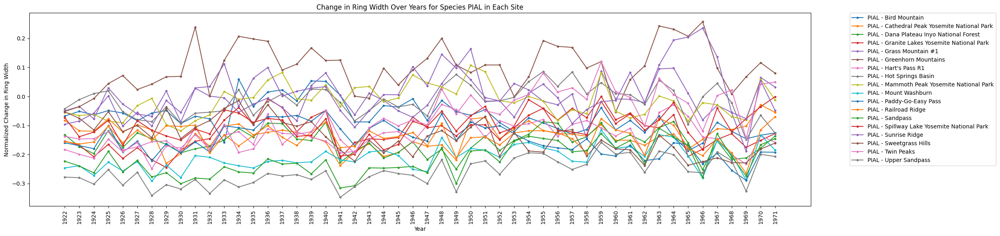

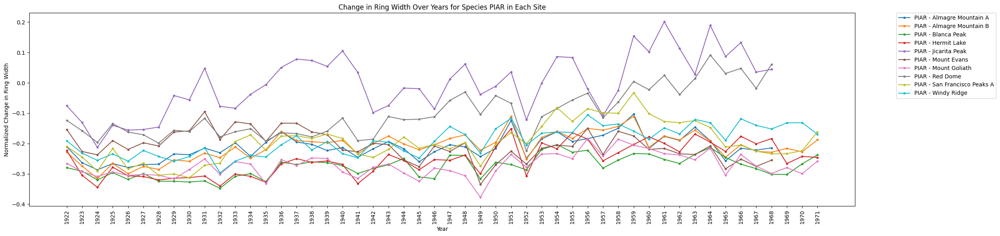

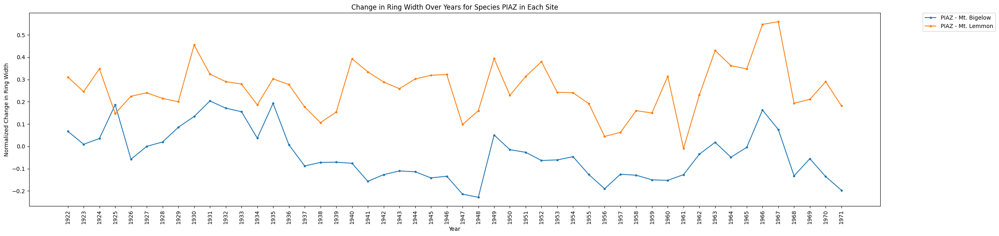

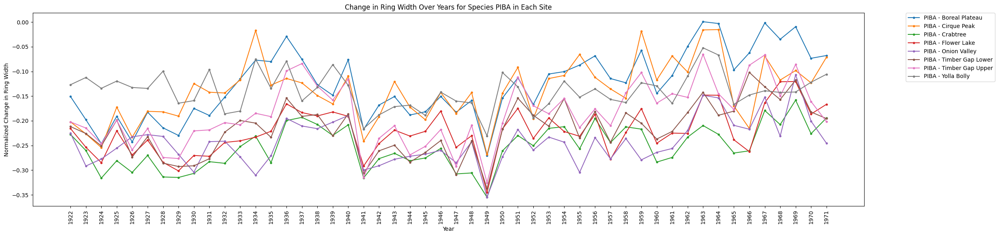

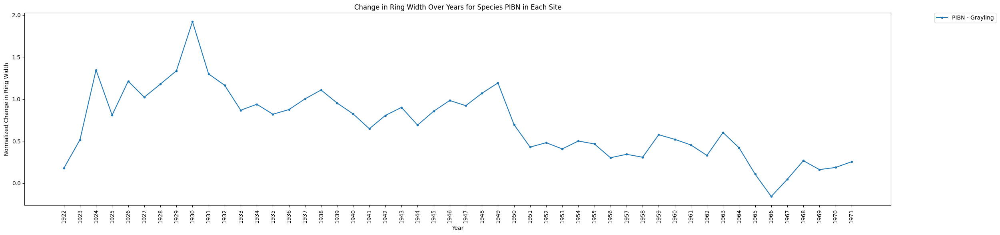

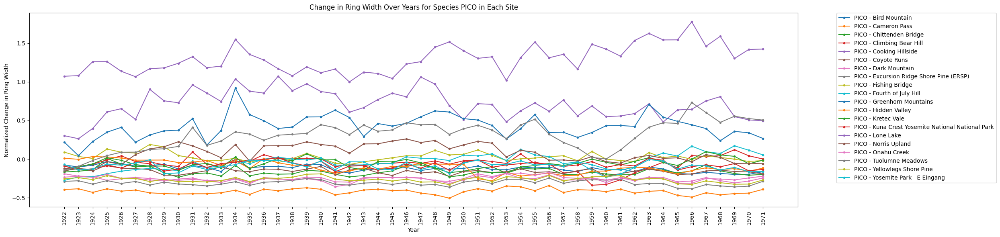

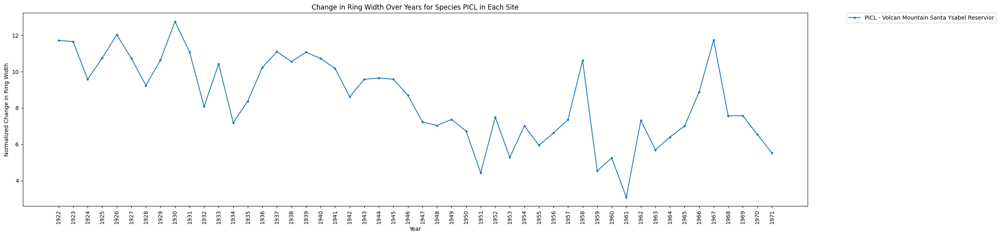

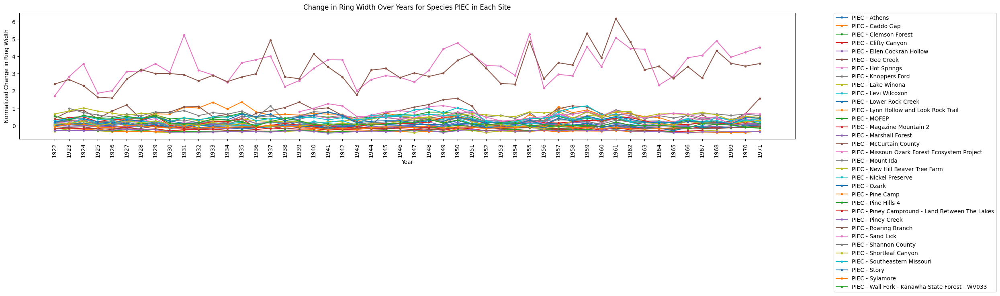

<ipython-input-49-91ce6d86eb15>:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


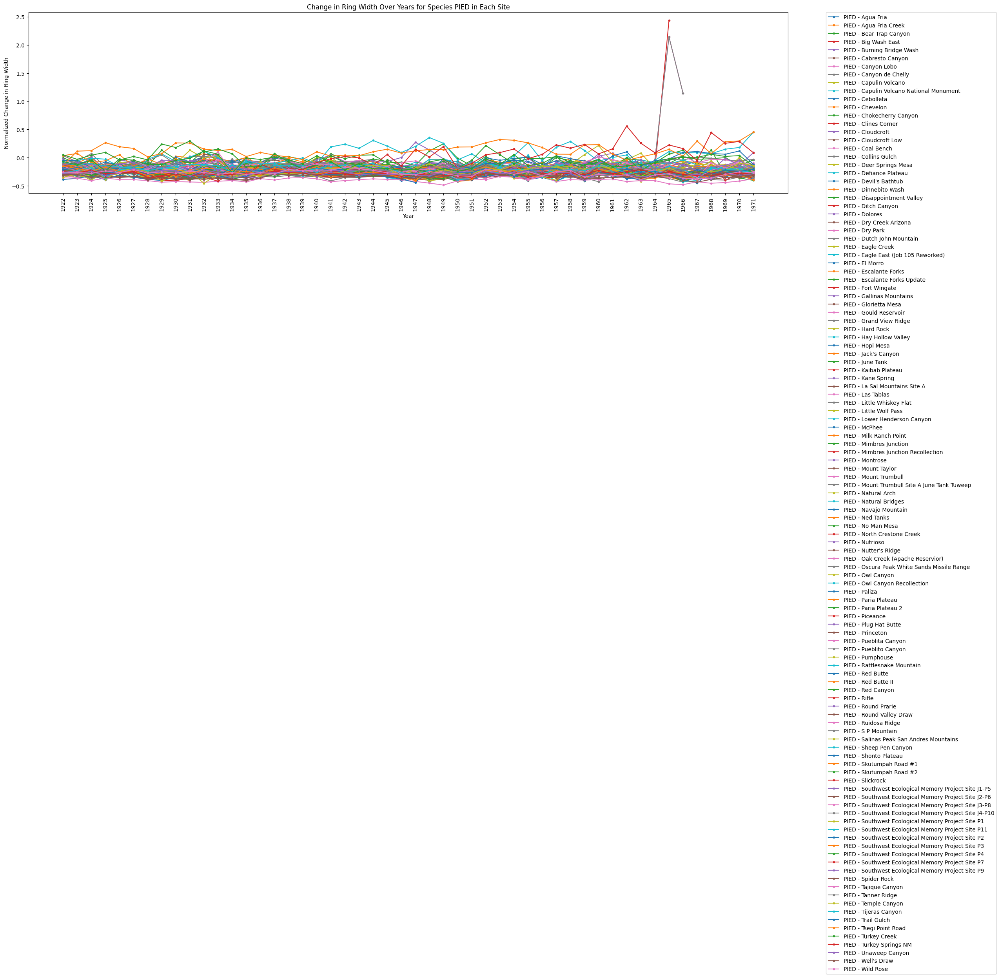

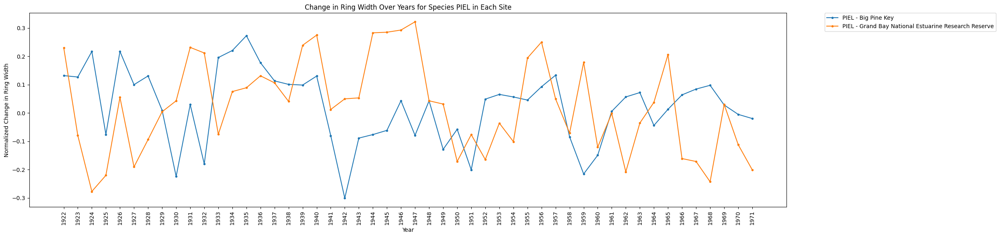

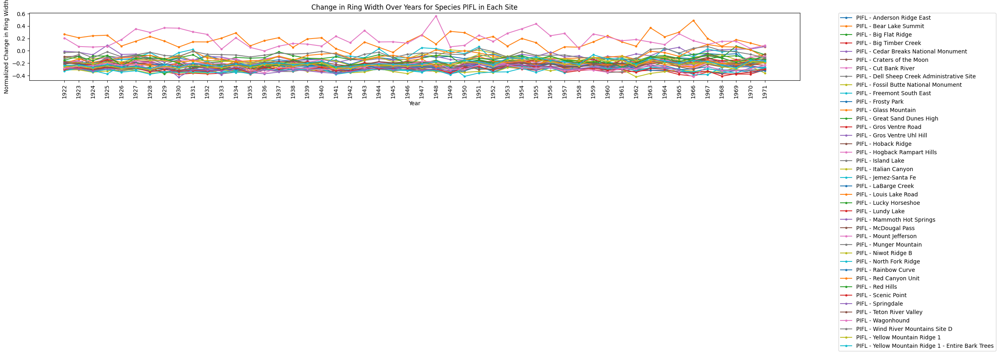

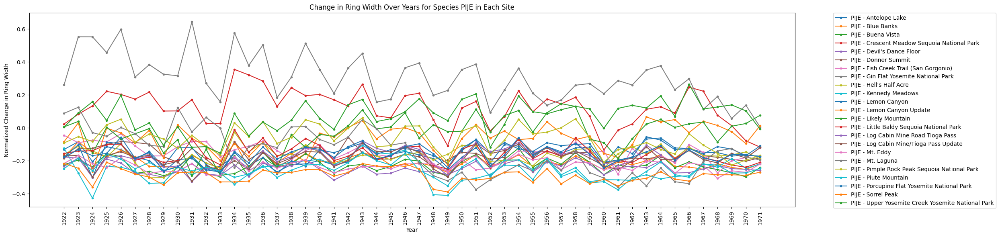

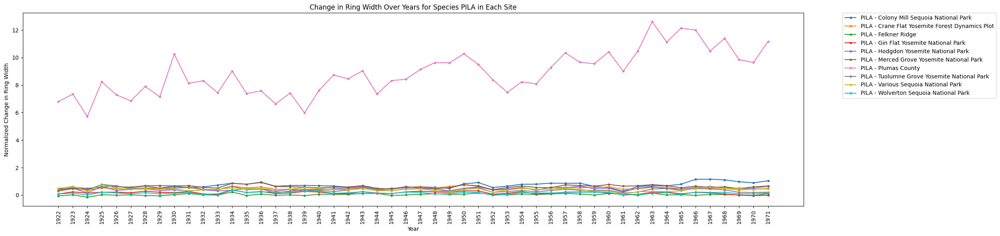

...

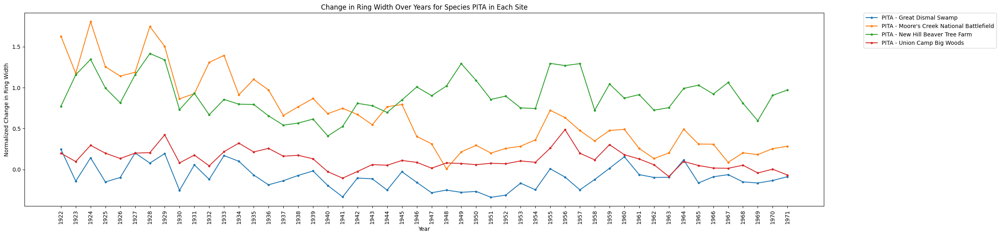

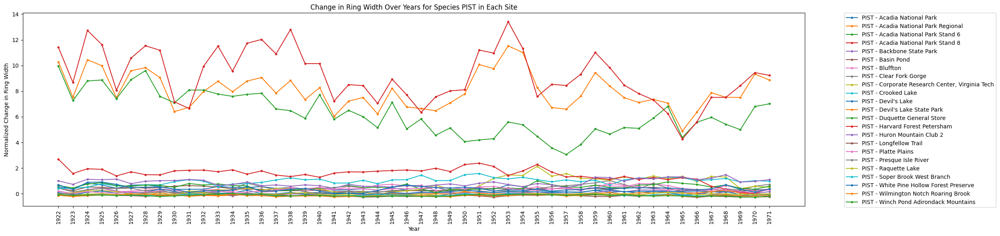

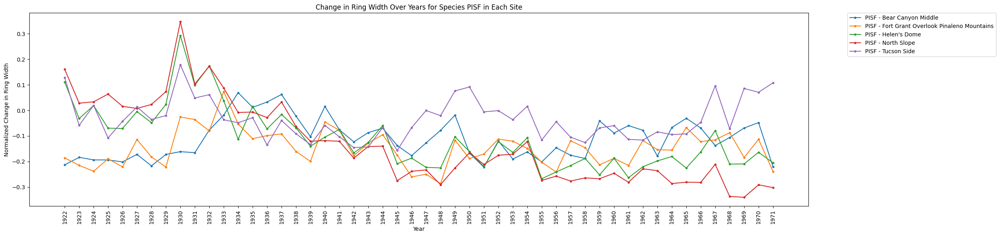

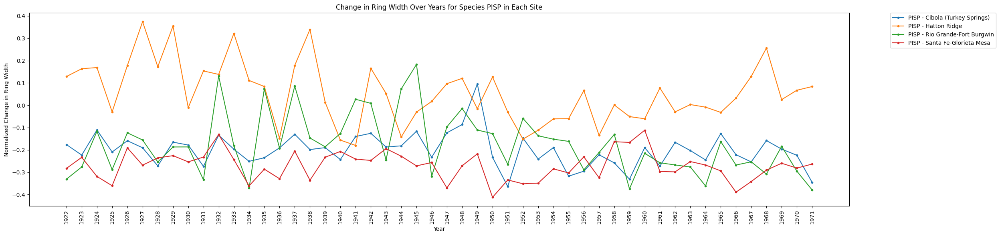

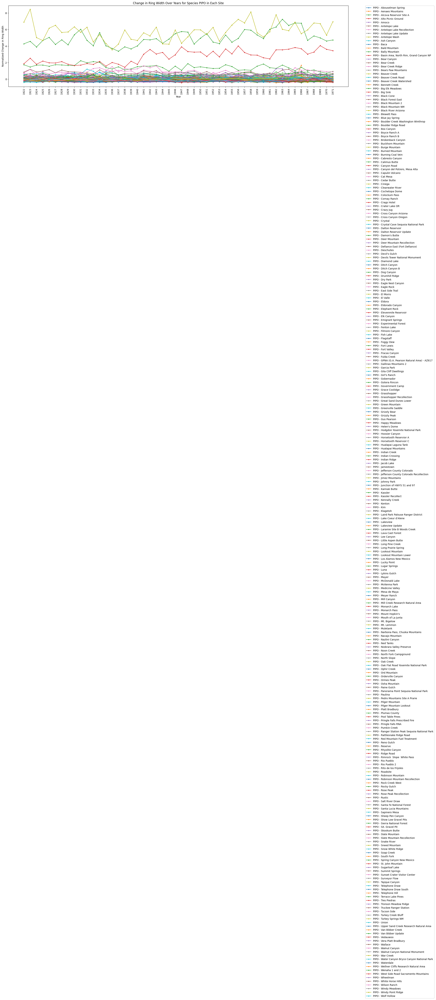

Plots saved successfully.


In [49]:
output_directory = '/content/drive/MyDrive/AI4C-Project/ChangesOverYearsPlots/'
os.makedirs(output_directory, exist_ok=True)

for idx, df_species_data in enumerate(dfs_species_data):

    fig, ax = plt.subplots(figsize=(25, 6))

    for (site, species), data in df_species_data.groupby(['site', 'species']):
        plt.plot(data.columns, data.values.flatten(), label=f"{species} - {site}", linestyle='-', marker='o', markersize=3)

        if len(data) > 20:
            plt.plot([], [], ' ', label='')

    plt.xlabel('Year')
    plt.ylabel('Normalized Change in Ring Width')
    plt.title(f'Change in Ring Width Over Years for Species {species} in Each Site')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xticks(rotation=90)
    plt.tight_layout()
    output_filename = os.path.join(output_directory, f'species_plot_group_{idx + 1}.png')
    plt.savefig(output_filename)
    plt.show()

print("Plots saved successfully.")
